In [26]:
# For anonymous database calling
import db_caller

# For dataframes and plots
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# For visuals
from IPython.display import HTML, display

# For PCA
from sklearn.decomposition import PCA
# For NMF
from sklearn.decomposition import NMF
from sklearn.cluster import KMeans

# (Custom-made) For SVD, PCA, and Plotting
from dr_tools import *

In [2]:
# For plot style
plt.style.use('tableau-colorblind10')
plt.rcParams['axes.facecolor'] = '#f8ffde'
plt.rcParams['text.color'] = 'xkcd:tree green'
plt.rcParams['axes.labelcolor'] = 'xkcd:navy green'
plt.rcParams['xtick.color'] = 'xkcd:navy green'
plt.rcParams['ytick.color'] = 'xkcd:navy green'

# For centering plots and notebook style
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}

h1 {
    color: #a8150a;
    font-family: Helvetica, sans-serif;
    font-weight: 800;
    font-size: 40px;
    font-style: italic;
}

h2 {
    color: #00446e;
    font-family: Helvetica, sans-serif;
    font-weight: 400;
    font-style: italic;
}
</style>
""")

<center><img src='Title.png' width=500></center>
<center>
    <span style='color:gray;font-size:14px;padding:10px;'><em>An analysis of our <b><span style='color:black'>imagination of nature</span></b> through Bob Ross paintings</em>
    </span>
</center>

# Executive Summary

Nature is limitless, but is our imagination of it limitless too?

The Joy of Painting was a prolific art instructional TV show that went on for over 400 episodes, with each episode dedicated to a nature painting. This study aims to provide a more expanded understanding on the artistic style and preferences of the late Bob Ross, to get insight into what paintings he preferred and what aspects he considered. This study was conducted by collecting data from `twoinchbrush`, performing exploratory data analysis to shed more light on the artistic-stylistic inclinations of Bob Ross, then using dimensionality reduction and factor analysis through Truncated Singular Value Decomposition (SVD) to extract the latent themes that Bob Ross's paintings contain. 

Just like Bob Ross's outlook and disposition, we found that his artistic style was brimming with life and color. Bob Ross had a preference for lush paintings full of green life, depicted using a variety of high and low color contrast palettes. We extracted 8 main themes from our dimensionality reduction, and discovered that the features we defined as `Barrenness` explained more than half of the painting's hidden themes. Nature paintings can simply be classified based on how much green life there is. 

However, despite its high explanation, we concluded that all themes combined are what make Bob Ross's paintings unique. It is with the less important themes of `color contrast`, `altitude`, `atmosphere`, `season`, `time`, among others, that a full composition is given life. These are aspects that most likely did not cross Ross's mind, but nevertheless are subconsciously embedded in the consideration of his art pieces.

As Bob Ross once said, "there are no mistakes, just happy little accidents." We see in his artistic improvisations from his show's episodes that his art represents expressions of his character, vibrant paintings from an artist of similar vibrance.

# Introduction

Art surrounds us. It drives us. It brings beauty to inelegance, harmony to discord. It is our way of manifesting the deepest expressions of the human soul. The moment humanity first grazed the wonders of art, they never let it leave their grasp. Art has since then become a part of our day to day lives. It exists both in the seemingly mundane present and the finer details we never seem to catch. Bob Ross is an American painter and creator and host of the TV show the Joy of Painting. It's in this show that he demonstrates himself starting and finishing paintings within the span of a normal television episode while instructing viewers on how to replicate a similar painting. How he made painting so deep yet simple and attainable alongside his bright disposition made him into a household name. In this study, we wish to look into the vision and beauty behind the works of Bob Ross and hopefully understand more about the inner machinations of his artistic brilliance.

## Background

Being Bob Ross fans ourselves with one of us being artists themselves, the group wanted to look into Bob Ross's paintings as a breath of fresh air - a bright, light topic amidst other rigid datasets we've had to study over the months. Art after all is fueled by passion and creativity, and we're hoping as well that we get to show similar in how we approach this study. Art is in the eye of the beholder, it's an expression of one's humanity, and that itself cannot ever fully be quantified. We hope that not only are you able to take some insight on the artistic prowess of Bob Ross from this, but also enjoy reading through this as well, as we did ourselves discussing and creating this report.

## Problem Statement

For this study, our driving problem statement is as follows:

<div class="alert alert-block alert-success">
    What are the main themes and visual features in Bob Ross's nature paintings?
</div>

In particular, we would like to find out:
1. What hidden themes did Bob Ross consider in his nature paintings?
2. Which themes were most important to defining Bob Ross's nature paintings?
3. Based on these themes, what kind of paintings did Bob Ross have a higher tendency to make?

# Methodology

<center><img src="Method.png" width="700px"></center>

To analyze Bob Ross’ paintings and examine the prevalent themes across his works, several techniques learned from Data dimensionality reduction will be used and implemented.

1. **Data Collection**: The group loves Bob Ross, his quick-witted painting skills, and his soothing showmanship. Because of this, we shall explore the database website twoinchbrush.com showcasing all the works he painted for his show The Joy of Painting. Data mining will be done through web scraping, extracting attributes colors and nature tags associated with each painting. 
2. **Exploratory Data Analysis:** After all of the data has been stored to a local SQL database, preliminary exploration will be done on the design matrix of features to familiarize with the nuances of the data.
3. **Dimensionality Reduction:** The project will use Truncated SVD to get the desired number of most relevant singular vectors, given 80% explained variance. The resulting number of SVs will be analyzed through item factor analysis, looking for the correlations of the tags, and interpret the underlying theme for each SV. The group also attempted Principal Component Analysis without SVD and Nonnegative Matrix Factorization, but found these to be less useful than Truncated SVD in understanding the sparse matrix for latent themes. These explorations can be found in the Appendix.
4. **Factor Analysis:** Lastly, a comparative analysis will be implemented, looking through the paintings database and see which painting best represents each SV/derived theme. These themes will be subjectively interpreted based on the top projected features SV, and a sample of paintings from each extreme of the SV for visual aid.

# Data Collection

## Data Source Description

The dataset used in this project was web scraped from `twoinchbrush.com`, a website dedicated for Bob Ross paintings created during the run of PBS TV show The Joy of Painting. Focusing on instructional painting, The Joy of Painting is hosted by the painter himself and ran for a total of 403 episodes. For this project, we will be extracting paintings from the first 9 seasons of The Joy of Painting.

For each painting compiled in the website, there are two types of painting tag features:

1. Painting `nature attributes` (e.g. 'Mountains', 'Forest', 'Bushes'); and 
2. Painting `colors used` (e.g. 'bright red', 'cadmium yellow').

An example of a painting's webpage on the site can be seen below. Nature attributes are under 'Tags', while colors used are under 'Colors needed' -- both are extracted as relevant features for the final design matrix.

<center><img src="Webpage.jpeg" width=500px></center>

## Data Limitations

The dataset is comprised wholly of tags and colors scraped from the Bob Ross painting database of `twoinchbrush.com`. The assumption then is that the colors attributed to each painting are correct and accurate; this goes for the tags assigned as well, which were manually user-defined by site owners.

The database also solely contains 'nature paintings'. Analysis of themes and the combination of colors and tags are necessarily limited in scope to the nature category. Other works of Bob Ross outside this category are not included in the analyses of this study.

The dataset may also not be generalizable to other artists, even with nature as the theme. The database solely contains Bob Ross works and must be augmented with works from other artists for proper generalization.

## Data Scraping

Contents were scraped using the `requests`, `bs4`, `os`, and `urlparse` libraries. Titles, season numbers, episode numbers, links, and a list of color and nature tags were extracted from each page. Painting pages were extracted using the regex token `r'S\dE\d'` (Season x Episode y), so as not to scrape a non-painting page.

The whole matrix was then converted to a sparse boolean matrix where each feature is a tag, 0 = not a tag for a painting, and 1 = an existing tag for a painting. The full scraping code can be found in `db_maker.ipynb`.

In [3]:
# Connect to scraped painting database
conn = db_caller.connect('LRFinal.db')

# Read painting database
full_df = pd.read_sql('SELECT * FROM paintings', conn)
painting_df = pd.read_sql('SELECT * FROM paintings', conn).iloc[:, 4:]

# Preview of painting features
caption('Painting Database', 'Each column represents a tag, and each row is a\
 painting. A value of 0 means the painting was not tagged with this feature, \
 a value of 1 means the painting was tagged. Tags are a combination of colors\
  used and user-defined nature attributes identified in the painting. \
<br>The entire DataFrame has 117 paintings and 65 unique tags.',
        fig=False)
show_df(painting_df.head())

,forest,autumn,sunset/sunrise,landscape,lake/pond,conifer tree,deciduous tree,bushes,mountains,foothills,summer,cloudy,portrait,stream,flowers,dark background,river,winter,stormy,cabin,fence,rocks,spring,underpainting,waterfall (small),bare tree,clear sky,nighttime,beach,seascape,path,ocean,waves,barn,knife only,waterfall (big),palm tree,bridge,other,person,double-painting,q&a-episode,sawblade,guestpainter,contact paper,desert,cactus,northern lights,alizarin crimson,bright red,cadmium yellow,phthalo green,prussian blue,sap green,titanium white,van dyke brown,black gesso,burnt umber,indian yellow,phthalo blue,yellow ochre,liquid black,midnight black,liquid clear,dark sienna
0,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0
1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0
2,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0
3,1,0,0,1,0,1,1,1,1,1,0,1,1,0,0,0,0,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,0
4,1,0,0,1,0,0,1,1,1,1,1,0,1,1,1,0,0,0,0,0,0,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0


# Exploratory Data Analysis

Before performing Dimensionality Reduction, the matrix was analyzed using simple descriptive techniques. The key aspects looked at were most and least frequent tags and colors, most and least frequent colors, and features that have a high positive or negative correlation to each other.

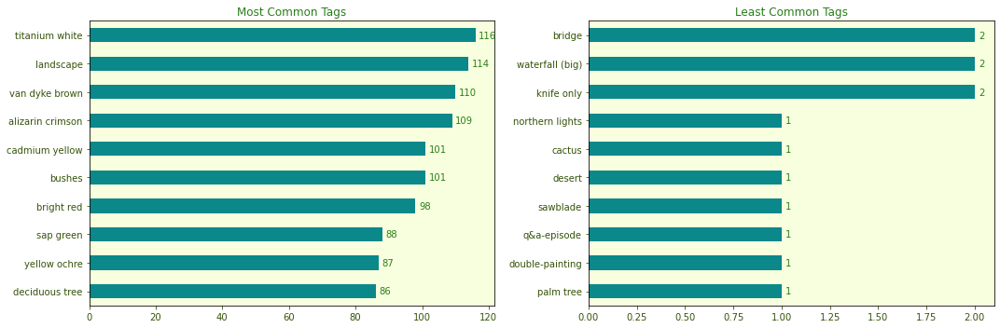

In [4]:
# Plot the 10 most commonly used tags
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plot_df = painting_df.sum(axis=0).nlargest(10).sort_values()
plot_df.plot.barh(ax=ax[0], color='xkcd:dark cyan')
ax[0].set_title('Most Common Tags')
for ind, i in enumerate(plot_df):
    ax[0].text(i+1, ind-0.1, i)

# Plot the 10 least commonly used tags
plot_df = painting_df.sum(axis=0).nsmallest(10)
plot_df.plot.barh(ax=ax[1], color='xkcd:dark cyan')
ax[1].set_title('Least Common Tags')
for ind, i in enumerate(plot_df):
    ax[1].text(i+0.02, ind-0.1, i)

fig.tight_layout()

caption('Most and Least Common Tag Frequency',
        'The following are a combination of nature attributes and colors \
        used.')
plt.show()

With this data set, nature paintings mostly depict landscapes, bushes, and deciduous trees as evidenced by the extracted most common tags from the data. Most commonly contrasting evergreen, sap green, cadmium yellow, and yellow ochre emerge as some of the most common color attributes of Bob Ross nature paintings. On the other hand, it is rare to see a cactus in these paintings, mostly associated with desert, which is least likely the top of mind when imagining nature. Cactus and desert then are some of the least common tags across the board, together with palm tree, sawblade, and northern lights.

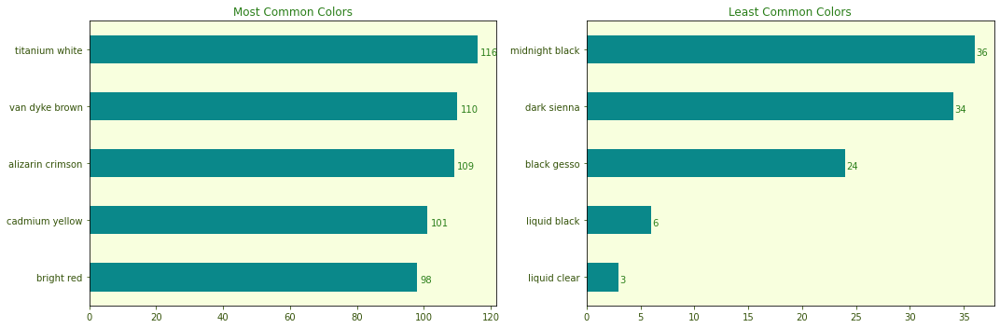

In [5]:
# Plot the 10 most commonly used colors
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
plot_df = painting_df[painting_df.columns[48:]].sum().nlargest(5).sort_values()
plot_df.plot.barh(ax=ax[0], color='xkcd:dark cyan')
ax[0].set_title('Most Common Colors')
for ind, i in enumerate(plot_df):
    ax[0].text(i+1, ind-0.1, i)

# Plot the 10 least commonly used colors
plot_df = painting_df[painting_df.columns[48:]
                      ].sum().nsmallest(5).sort_values()
plot_df.plot.barh(ax=ax[1], color='xkcd:dark cyan')
ax[1].set_title('Least Common Colors')
for ind, i in enumerate(plot_df):
    ax[1].text(i+0.1, ind-0.1, i)

fig.tight_layout()

caption('Most and Least Common Color Frequency',
        'The following only consider the color features in the database.')
plt.show()

`Titanium white` is the most commonly used color across Bob Ross paintings, present in almost all. These are followed by `van dyke brown`, `alizarin crimson`, `cadmium yellow`, and `bright red`, which when combined, lean toward more bright and lively paintings. Dark colors are the least common colors used such as midnight black, dark sienna, and black gesso, which can mean less paintings in the database depict nighttime or gloomy atmosphere.

In [6]:
# Create a Correlation Matrix from the design matrix
corr = painting_df.corr()
cols = corr.columns

# Isolate correlations with an absolute correlation >= 0.70
high_corr = []
for col in cols:
    for row in cols:
        if np.abs(corr.loc[row, col]) >= 0.70 and np.abs(corr.loc[row, col]) < 1.0:
            high_corr.append([row, col, corr.loc[row, col]])

# Create a DataFrame of high correlation items
corr_df = pd.DataFrame(high_corr, columns=['Feature 1',
                                           'Feature 2',
                                           'Correlation'])
corr_df.drop_duplicates('Correlation', inplace=True)
corr_df['Correlation'] = corr_df['Correlation'] * 100

caption('High Correlation Features', 'These are features with an absolute \
correlation greater than or equal to 0.70.', fig=False)
show_df(corr_df.sort_values('Correlation', ascending=False))

,Feature 1,Feature 2,Correlation
5,ocean,seascape,95.898011
6,waves,seascape,86.467540
0,black gesso,dark background,84.855529
14,dark sienna,midnight black,83.768648
2,ocean,beach,82.920652
3,waves,beach,78.130841
1,seascape,beach,76.739942


We looked at the absolute correlation scores among the features. Some of the most correlated features, having an absolute score of 0.7 and above are ocean-seascape, ocean-beach, waves-beach, and seascape-beach, all describing form of water or the ocean in general. As also expected, dark sienna, midnight black, and black gesso are highly correlated with dark background, with the latter being comprised or painted mostly with dark colors. There are no features with a high negative correlation.

We retain these features despite the high correlation as we would like to see its relationships with other features in the design matrix, but are aware of the similarities/redundancies of these tags.

# Dimensionality Reduction

Dimensionality reduction was performed using Truncated SVD. The transformed matrix was plotted across the first 2 Singular Vectors (SVs) for interpretability, although no meaning from this plot can be easily derived yet.

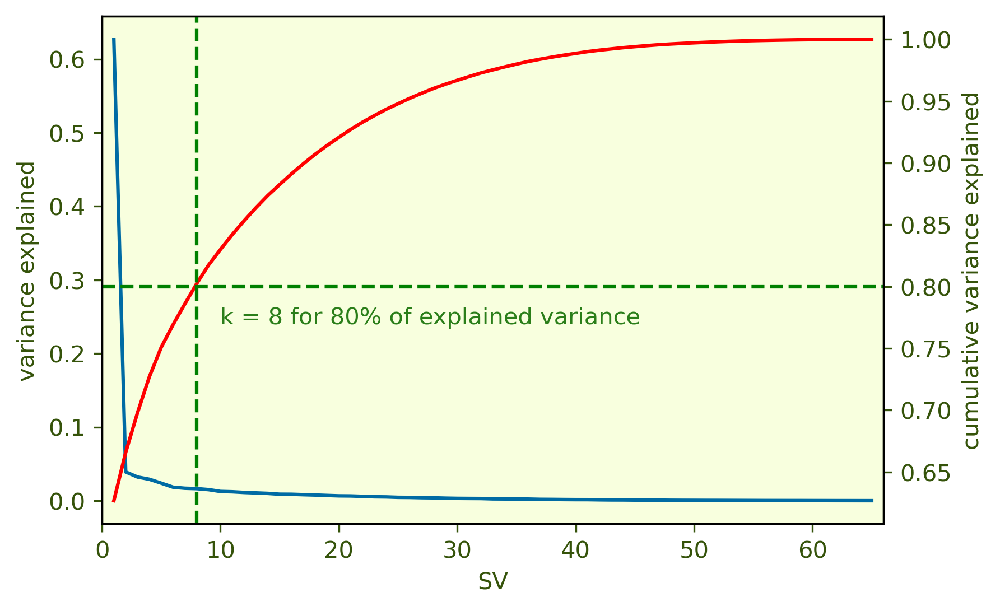

In [7]:
# Perform SVD on the design matrix, note features
q, s, p, nssd = truncated_svd(painting_df)
features = painting_df.columns

# Calculate value of k for 80% variance explained
for ind, n in enumerate(nssd.cumsum()):
    if n >= 0.8:
        k = ind+1
        break

# Plot the SVD scree plot
fig, ax = plt.subplots(dpi=300)
ax.plot(range(1, len(nssd)+1), nssd, '-', label='individual')
ax.set_xlim(0, len(nssd)+1)
ax.set_xlabel('SV')
ax.set_ylabel('variance explained')
ax = ax.twinx()
ax.plot(range(1, len(nssd)+1), nssd.cumsum(), 'r-', label='cumulative')
ax.axhline(0.80, ls='--', color='g')
ax.axvline(k, ls='--', color='g')
ax.text(10, 0.77, 'k = 8 for 80% of explained variance', ha='left')
ax.set_ylabel('cumulative variance explained');

caption('Scree Plot for Singular Value Decomposition',
        f'k = {k} is needed for 80% explained variance. \
        During factor analysis, the group will only examine the top 8\
        singular vectors. The variance explained for the first SV already \
        explains more than half of the variance, with a severe drop in SV2. \
        This will be taken into consideration when interpreting each SV \
        during Factor Analysis.')
plt.show()

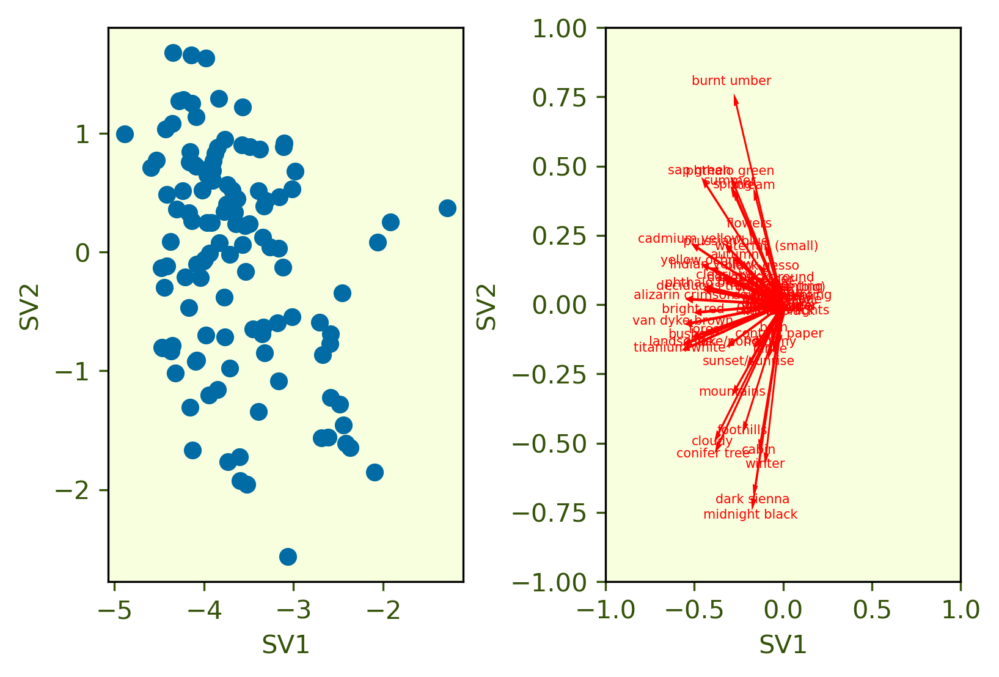

In [8]:
# Project the design matrix
X_new = project_svd(q, s, k)

# Plot the projected matrix using the first 2 singular vectors
caption('Singular Vector Plot (SV1 and SV2)',
        'The meanings of these plots will be further discussed in results, as\
        no factor analysis has been performed yet. From initial inspection, \
         there are no meaningful feature vectors or datapoint clusters. It\
          would appear burnt umber is near-parallel with SV2, as well as\
           midnight black and dark sienna in the opposite direction. Most of\
           the vectors and datapoints prefer to stay near the left.'
       )
plot_svd(X_new, features, p)

# Factor Analysis

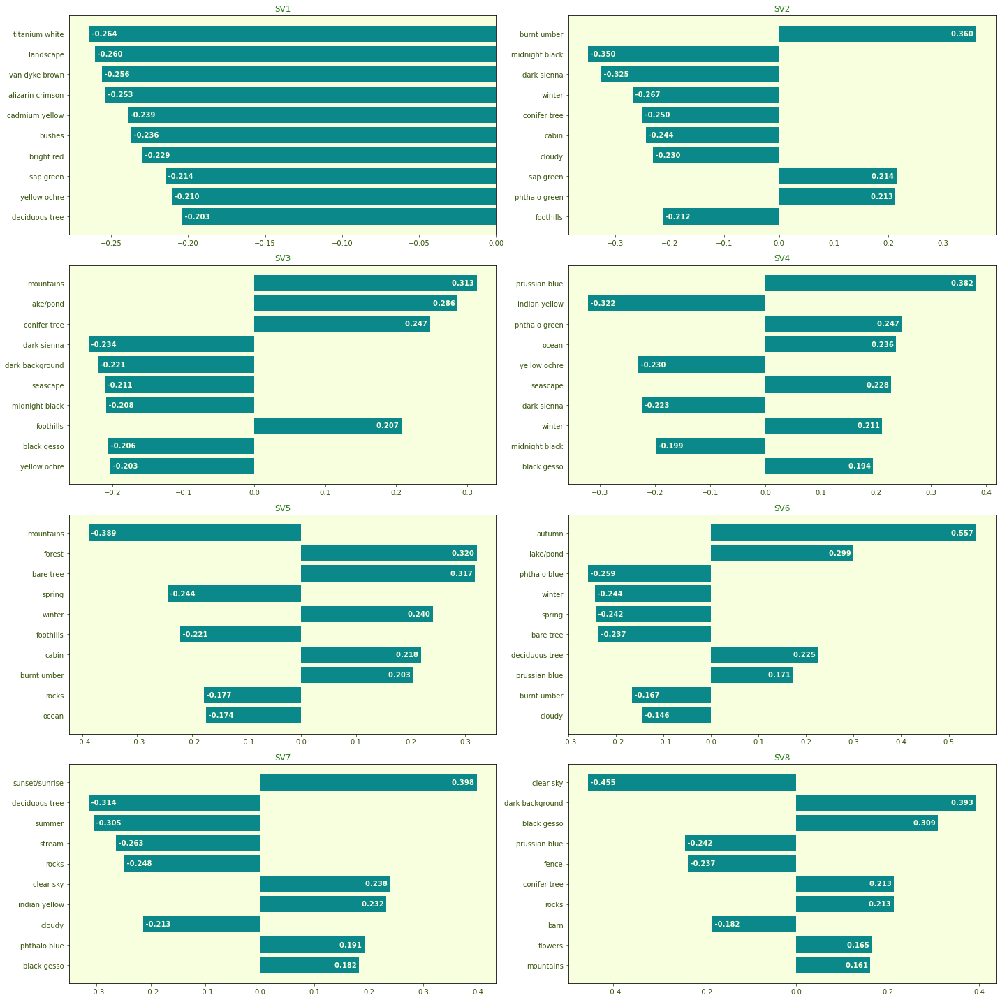

In [9]:
# Plot the top 8 SVs with its top 10 most important features
fig, ax = plt.subplots(4, 2, figsize=(20, 20))
for i, a in enumerate(ax.flatten()):
    order = np.argsort(np.abs(p[:, i]))[-10:]
    a.barh([features[o] for o in order], p[order, i], color='xkcd:dark cyan')
    for n, v in enumerate(p[order, i]):
        if v > 0:
            a.text(v, n-0.1, str(v)[0:5]+' ', color='#F8FFDE',
                   fontweight='bold', ha='right')
        if v < 0:
            a.text(v, n-0.1, ' '+str(v)[0:6], color='#F8FFDE',
                   fontweight='bold', ha='left')
    a.set_title(f'SV{i+1}')
fig.tight_layout()

caption('First 8 Singular Vectors', 'The following are the top 10 features \
of each of the 8 SVs needed to explain 80% variance. The meanings of each \
SV will be further discussed in Results, with visual aids (example\
 paintings) per SV.')
plt.show()

The following code cell was used to extract 10 paintings from both extremes of each SV in order to aid in the interpretation of its singular vectors. These paintings were compiled in a directory, `paintings`, where each SV folder contains a `negative` and `positive` folder for paintings of both extremes. These will be called later on in the results plots.

<div class="alert alert-block alert-success">
This cell takes ~30 minutes to run.
</div>

```python
import os
import requests
import bs4

root_url = 'https://www.twoinchbrush.com'

for sv in trange(8):
    new_folder = 'paintings/SV_' + str(sv+1)
    if not os.path.exists(new_folder):
        os.makedirs(new_folder)

    for page in full_df.iloc[np.argsort(X_new[:, sv])[:10]]['Link']:
        new_mini_folder = os.path.join(new_folder, 'negative')
        file_name = os.path.basename(page) + '.webp'

        if not os.path.exists(new_mini_folder):
            os.makedirs(new_mini_folder)
        
        soup = bs4.BeautifulSoup(requests.get(page).text)
        time.sleep(np.random.choice(np.arange(1, 6)))

        painting_url = soup.select_one('img')['src']
        with open(os.path.join(new_mini_folder, file_name), 'wb') as f:
            resp = requests.get(root_url + painting_url)
            time.sleep(np.random.choice(np.arange(1, 6)))
            f.write(resp.content)
    
    for page in full_df.iloc[np.argsort(X_new[:, sv])[-10:]]['Link']:
        new_mini_folder = os.path.join(new_folder, 'positive')
        file_name = os.path.basename(page) + '.webp'

        if not os.path.exists(new_mini_folder):
            os.makedirs(new_mini_folder)

        soup = bs4.BeautifulSoup(requests.get(page).text)
        time.sleep(np.random.choice(np.arange(1, 6)))

        painting_url = soup.select_one('img')['src']
        with open(os.path.join(new_mini_folder, file_name), 'wb') as f:
            resp = requests.get(root_url + painting_url)
            time.sleep(np.random.choice(np.arange(1, 6)))
            f.write(resp.content)
```

# Results and Discussion

## Main Themes of Nature Paintings

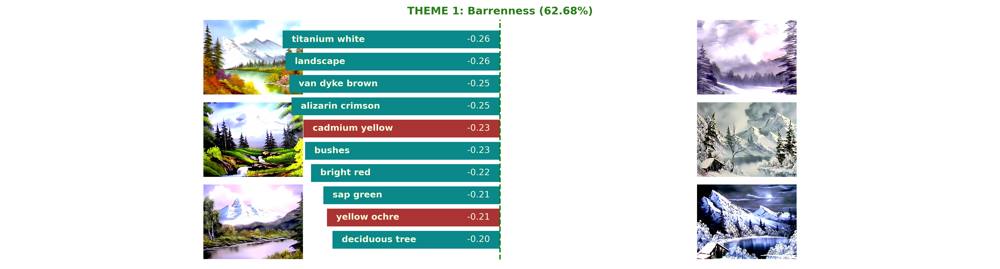

In [10]:
plot_theme(0, p, nssd, features,
           title='Barrenness',
           left_paintings=['cool-waters',
                           'mountain-hideaway', 'mountain-range'],
           right_paintings=['grey-winter', 'shades-of-grey', 'winter-moon'],
           highlights=['cadmium yellow', 'yellow ochre'])
caption('Barenness Factor Analysis', '')

The vector that explains 62.68% of the total variance is barenness. By far, this is the most blatant indicator of how Bob Ross's nature paintings can be classified. We can see that all of the features present are also synonymously the top used tags in the design matrix, as seen in the EDA. As expected, the bright colors that were also the top colors used went into paintings with very lush green life, as seen on the left. `Cadmium yellow` and `yellow ochre` in particular, combine to make a green characteristic of most the grass in these images. On the contrary, the paintings on the right depict a bleaker, barren landscape devoid of green.

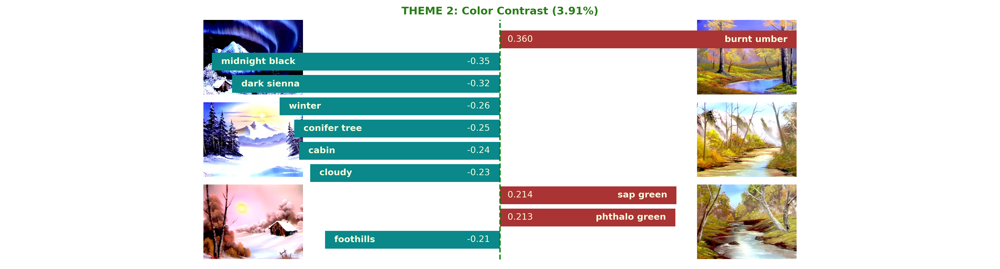

In [11]:
plot_theme(1, p, nssd, features,
           title='Color Contrast',
           left_paintings=['northern-lights',
                           'winter-evergreens', 'warm-winter-day'],
           right_paintings=['autumn-days',
                            'arizona-splendor', 'whispering-stream'],
           highlights=['burnt umber', 'sap green', 'phthalo green'])
caption('Color Contrast Factor Analysis', '')

Moving forward, the following themes are less prominent in explaining Bob Ross's paintings. The team identified this SV as color contrast, or the range of colors used to complete the paintings. On the right, we can see colors of `burnt umber` and `sap green` or `phthalo green`, in color theory, these are hues that are opposite to each other in the color wheel, indicating a wide range of colors used. When this is compared with the paintings on the left, we can see that these are monochromatic in color, sticking to blues, whites, and reds in unvaried hues throughout the entire composition.

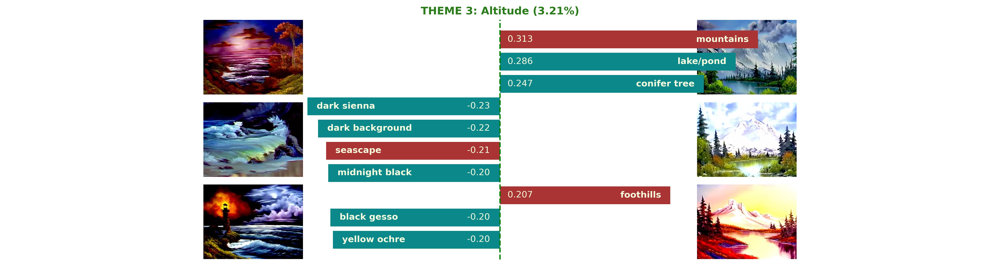

In [12]:
plot_theme(2, p, nssd, features,
           title='Altitude',
           left_paintings=['ebony-sea', 'evening-seascape', 'night-light'],
           right_paintings=['final-grace', 'mt-mckinley', 'horizons-west'],
           highlights=['mountains', 'seascape', 'foothills'])
caption('Altitude Factor Analysis', '')

Altitude is a strong determinant with regard to the atmospheric colors utilized. Towering formations such as `mountains` and `foothills` require distance to be fully captured; from afar, light images must be used to capture their details and silhouettes properly. On the other hand, `seascapes` require the opposite. To fully appreciate details of the waves and rock formations, one needs to be up close. This in turn allows the artist leeway to utilize a darker, more atmospheric tone. Another way to look at this theme is seeing it as the scope of each painting -- is it up close to the ground, or a view from high-up?

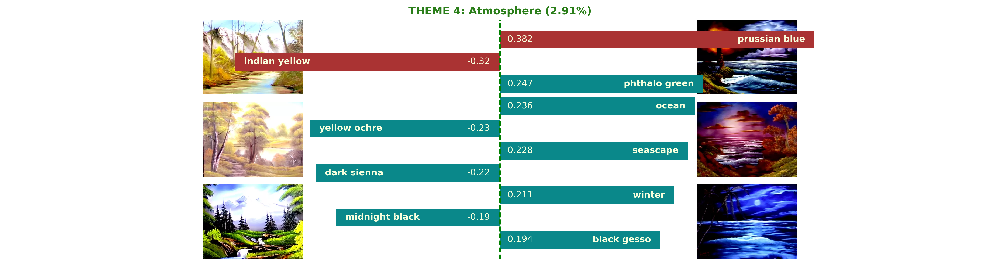

In [13]:
plot_theme(3, p, nssd, features,
           title='Atmosphere',
           left_paintings=['arizona-splendor',
                           'waterside-way', 'mountain-hideaway'],
           right_paintings=['night-light', 'ebony-sea', 'blue-moon'],
           highlights=['indian yellow', 'prussian blue'])
caption('Atmosphere Factor Analysis', '')

The paintings on the left present sceneries with clearer, fairer atmosphere featuring the color `indian yellow` predominantly while those on the right feature a hazier, somewhat more complex and miasmatic types of atmosphere with the color `prussian blue` standing out. One should bring up again the supposed color and variety Bob Ross likes to have in his paintings. It's because of this that his depictions of atmosphere in his works can be polarizing, either very clear or very hazy; and what this shows is that Bob Ross likes to make use of such to produce deep sceneries in his works.

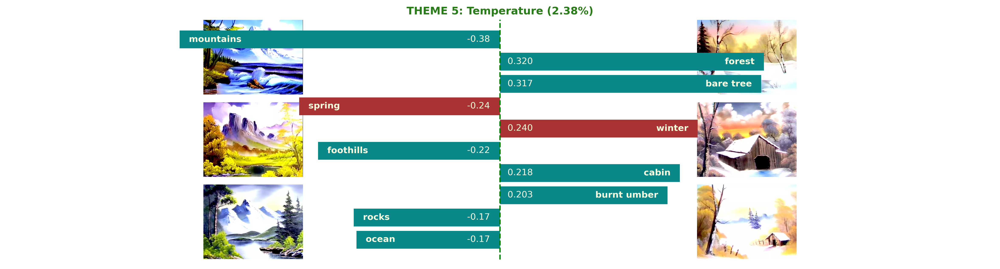

In [14]:
plot_theme(4, p, nssd, features,
           title='Temperature',
           left_paintings=['mountain-by-the-sea',
                           'natures-paradise', 'forest-hills'],
           right_paintings=['winter-stillness',
                            'barn-at-sunset', 'winter-hideaway'],
           highlights=['winter', 'spring'])
caption('Temperature Factor Analysis', '')

Looking back at the notion of life and vibrance in Bob Ross's paintings, one should note the apparent temperature in his paintings. The paintings on the left depict supposedly warm places, `spring`, while those on the right; the cold, `winter`. He seemingly either likes to paint mountainous backgrounds with a body of water in warm places near the painting's point of view or cold flatlands with cabins and bare trees. 

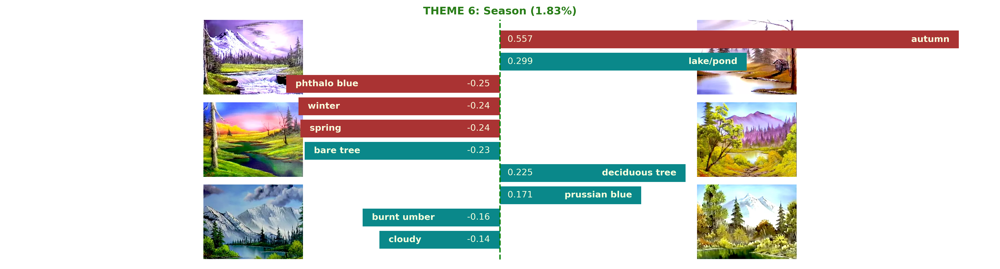

In [15]:
plot_theme(5, p, nssd, features,
           title='Season',
           left_paintings=['arctic-beauty', 'blaze-of-color', 'final-grace'],
           right_paintings=['hunters-haven',
                            'hidden-lake', 'final-reflections'],
           highlights=['autumn', 'winter', 'spring', 'phthalo blue'])
caption('Season Factor Analysis', '')

Categorization of the paintings with the 'Season' factor is straightforward. Most pronounced is brightness of `autumn` paintings on the right, and summery paintings with dry heat. While on the left, cooler colors are utilized represent `spring` and especially `winter`. This is evidenced further by the continued presence of `phthalo blue`, used for rich clear skies found in the beginning of spring or the end of winter.

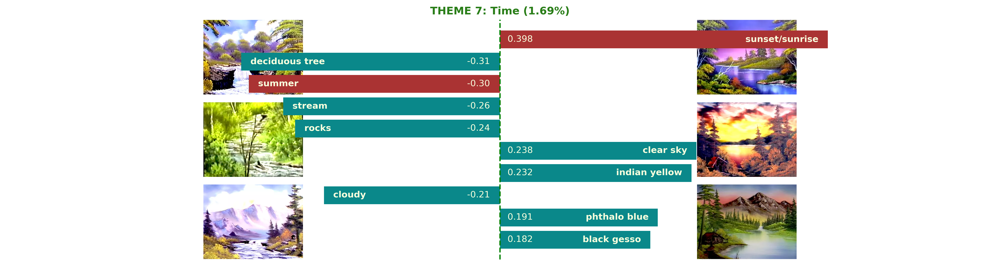

In [16]:
plot_theme(6, p, nssd, features,
           title='Time',
           left_paintings=['misty-waterfall',
                           'quiet-stream', 'bubbling-mountain-brook'],
           right_paintings=['blue-river', 'red-sunset', 'mountain-retreat'],
           highlights=['sunset/sunrise', 'summer'])
caption('Time Factor Analysis', '')

The paintings on the left depict sceneries taken during midday when the sun is high up in the sky, with harsh sunlight often characteristic of `summer`. Like in the case of photographs, Bob Ross opted to paint these scenes with an overcast sky to avoid blowing up the highlights. Noontime scenes of this nature are best captured during summertime, because the dry air makes the feature sharper and less hazy, the foliage is still vibrant, and the flowing water makes interesting reflections and add movement and dynamism to an otherwise static scene. 

Paintings on the right depict sceneries taken during dusk and dawn, `sunset/sunrise` when the sun is low in the sky, or towards the ends of the day. Photographers usually refer to the best timing to capture these sceneries as ‘golden hour’ and ‘blue hour,’ and Ross’ extensive use of `indian yellow` and `phthalo blue` captured these timings very well.

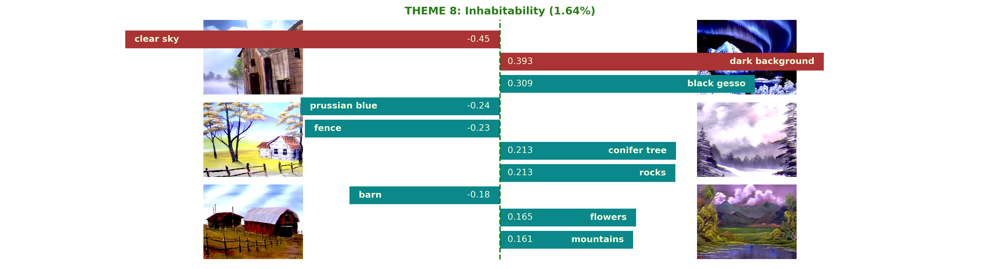

In [17]:
plot_theme(7, p, nssd, features,
           title='Inhabitability',
           left_paintings=['dock-scene',
                           'little-house-by-the-road', 'country-life'],
           right_paintings=['northern-lights',
                            'grey-winter', 'tranquil-valley'],
           highlights=['clear sky', 'dark background'])
caption('Inhabitability Factor Analysis', '')

Admirer's of Ross painting would immediately recognize the characteristic `clear sky` in majority of his nature paintings. Our last SVD figure will explore the `Inhabitability` theme of Bob Ross' painting. Paintings with nature tag `clear sky` combined with `fence` and `barn` indicate presence of man-made structures. Contrast these with paintings with a prominent `dark background` used with `black gesso` primer which illustrate a bleak, inhabitable landscape. Paintings with these tags may evoke feelings of emptiness and coldness, or places where people could not live in.

## Theme Tendencies of Nature Paintings

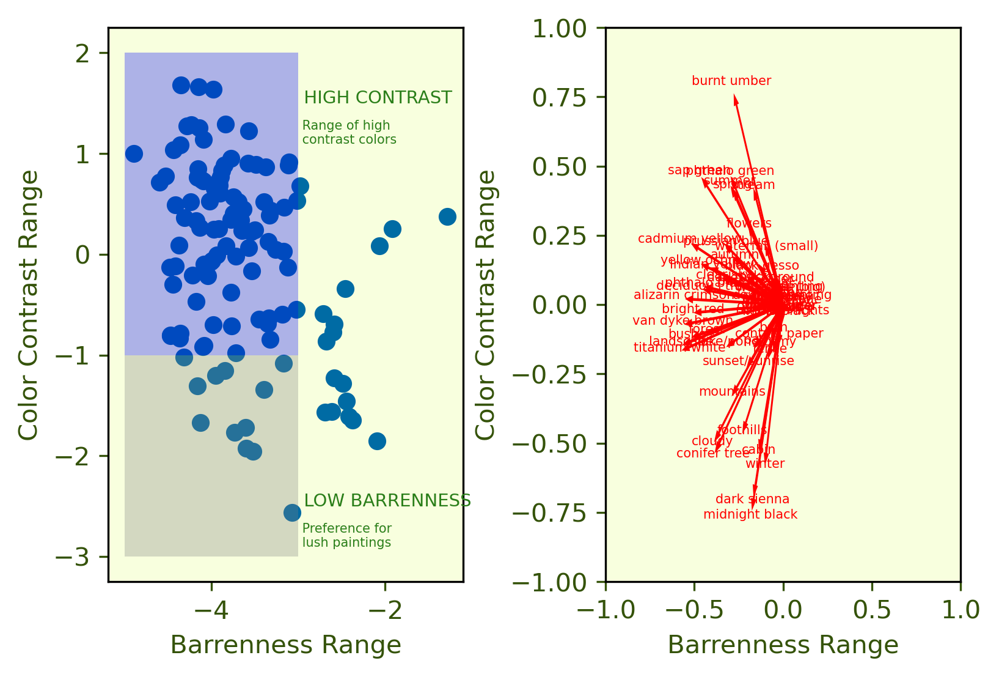

In [18]:
caption('Singular Vector Plot (Barrenness and Color Contrast)',
        "Now with meanings, we can see the tendencies of Bob Ross's paintings\
        . The x-axis, Barrenness, will now reveal that majority of Bob Ross's\
         paintings were skewed towards lush, green life on the left. As for \
         the y-axis, Color Contrast, Most of Ross's paintings were of varying\
         degrees of contrast, a lot of which were high contrast but also some\
          low contrast. This is in-line with the vibrant style which he is \
          known for."
       )
plot_annot_svd(X_new, features, p)

# Conclusion and Recommendations

## Conclusion

<center><img src="Importance.png" width=500px></center>

**Green is Key**

What are the limits of our imagination of nature? True to the theme, the most important singular value pertains to the barrenness or the intensity of greens in the painting. The attribute of `Barrenness` encompasses around 63% of the explained variations in the different paintings. With a huge leap in variation, the second most evident categorizing factor is painting contrast. This fits well in explaining the 'Nature' collection of Bob Ross, of which he used in show 'The Joy of Painting'. At its core, our imagination of nature can be defined solely by how much eye-catching greenery there is in the composition. Quite sad!

**Happy Little Accidents**

However, while we may see contributed variance drop off for the other categories, we need to take a step back and understand the context of the subject. The group posits that what makes a painting unique is that it often deviates from a template style of crafting: it is more than a sum of different parts. Other factors such as habitability, time, temperature and the like, all add flavor to the whole -- the themes identified apart from `Barrenness` are equally as important as a whole, when it comes to making an art piece that is uniquely Bob. A Bob Ross masterpiece is a mixture of all these little themes taken together -- these themes, or happy little accidents that come across the canvas without thought.

<div class="alert alert-block alert-success">
    <em>"There are no mistakes, just happy little accidents." -- <b>Bob Ross</b></em>
</div>

## Recommendations

Although Bob Ross passed away in 1995, his well-known works of art  still live on in the modern popular culture. As a prolific painter, he has produced hundreds of paintings. Our project has focused only on the nature paintings of Bob Ross. To further understand what makes a painting a Bob Ross painting, the group recommends:

* Expanding the scope of study beyond nature paintings or landscapes
* A robust analysis of his specific style and techniques can be a relevant input for any Bob Ross artwork authentication projects. 
* Computer vision/image processing to explore Bob Ross' studio praxis
* Stable Diffusion AI, to dissect the texture, perspective, and other visual features of his paintings which can be use to indicate similarities between paintings or artists, or which prior artworks have the greatest influence on Bob Ross, or the level of creativity (in terms of novelty and influence) for each painting.

Lastly, further analysis may be made using a larger database. Other works of Bob Ross may be integrated into the study to obtain a more holistic view into the mind of the artist, covering all his genres. We may also take a step further and include other artists as well covering the same genre, or spanned over all. Only then will we be able to peer into a more generalized view of painting themes. Advancements in image processing and AI art is the most logical forward-step with this study.

# References

* All about painting and Bob Ross. TwoInchBrush. (n.d.). Retrieved December 6, 2022, from https://www.twoinchbrush.com/
* Elgammal, A. (2016 ). Creating Computer Vision and Machine Learning Algorithms That Can Analyze Works of Art. Retrieved from https://www.mathworks.com/company/newsletters/articles/creating-computer-vision-and-machine-learning-algorithms-that-can-analyze-works-of-art.html

# Appendix

## List of Features

The following is a full list of the colors and nature attributes found in the design matrix. Colors are defined by their naming convention for oil paints.

![](P_Features.png)

## PCA without SVD

The group tried doing PCA without SVD, however found it less useful as it required 20 PCs to achieve the same amount of variance explained at 80%.

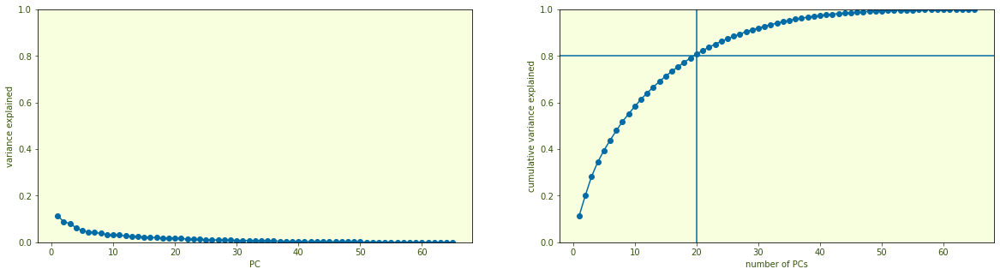

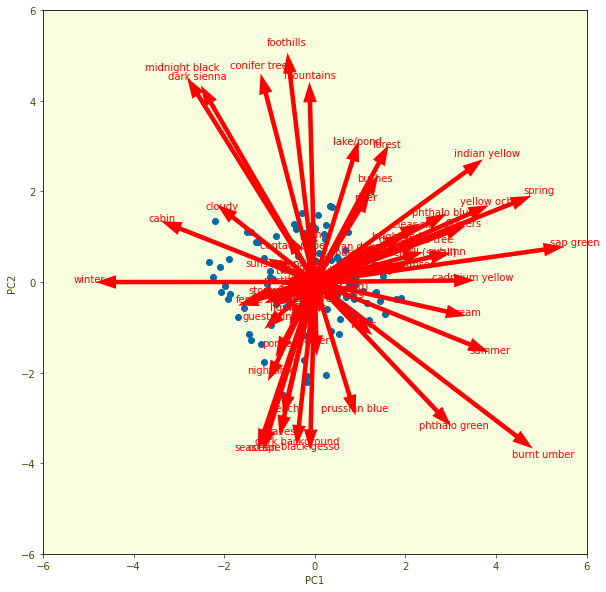

In [19]:
X_new, w, variance_explained = pca(painting_df.to_numpy())

fig, ax = plt.subplots(1, 2, figsize=(20, 5))

ax[0].plot(range(1, len(variance_explained)+1), variance_explained, 'o-')
ax[0].set_ylim(0,1)
ax[0].set_xlabel('PC')
ax[0].set_ylabel('variance explained');

for ind, vare in enumerate(variance_explained.cumsum()):
    if vare >= 0.8:
        k = ind+1
        break

ax[1].plot(range(1, len(variance_explained)+1), 
         variance_explained.cumsum(), 'o-')
ax[1].set_ylim(0,1)
ax[1].set_xlabel('number of PCs')
ax[1].set_ylabel('cumulative variance explained')
ax[1].axvline(k)
ax[1].axhline(0.8);

caption('Scree Plots and PC Plot for PC1 and PC2', '')
fig, ax = plt.subplots(1, 1, subplot_kw=dict(aspect='equal'), figsize=(10, 10))
ax.scatter(X_new[:,0], X_new[:,1])
features = painting_df.columns
for feature, vec in zip(features, w):
    ax.arrow(0, 0, 15*vec[0], 15*vec[1], width=0.1, ec='none', fc='r')
    ax.text(17*vec[0], 17*vec[1], feature, ha='center', color='r')
ax.set_xlim(-6, 6)
ax.set_ylim(-6, 6)
ax.set_xlabel('PC1')
ax.set_ylabel('PC2');

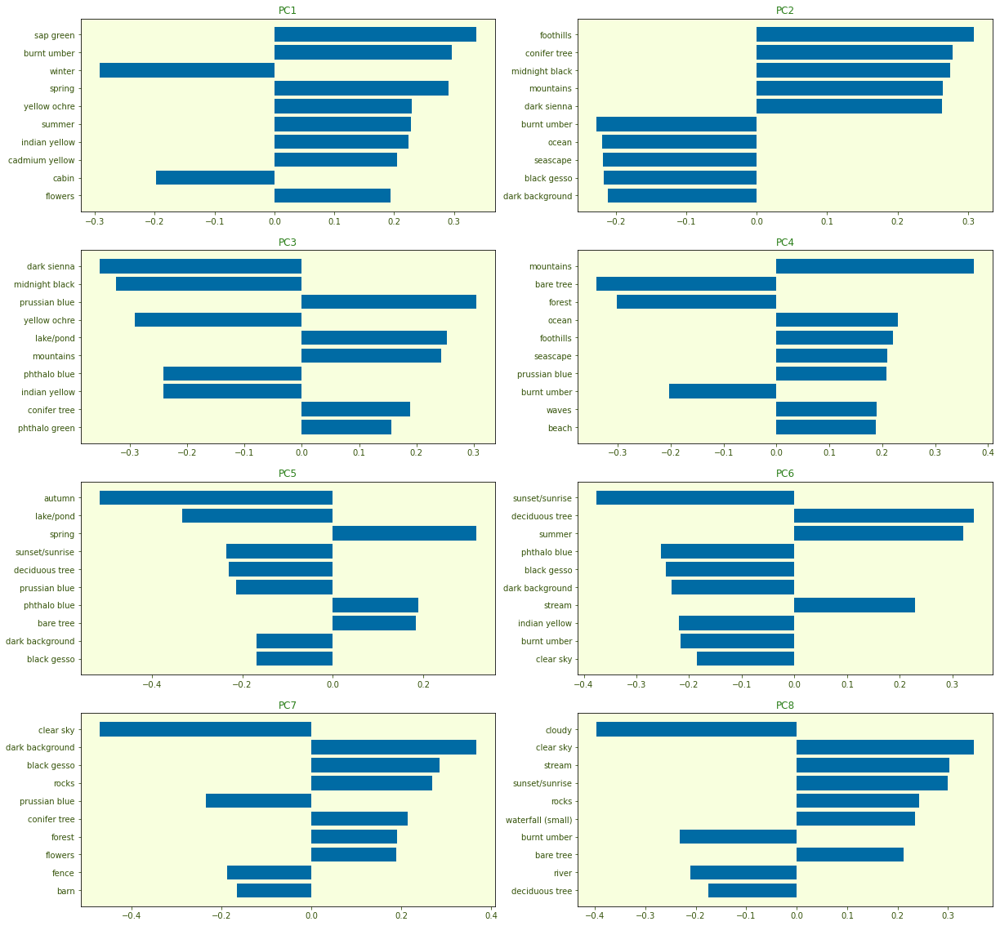

In [20]:
caption('First 8 Principal Components', '')
fig, ax = plt.subplots(4, 2, figsize=(20, 20))
for i, a in enumerate(ax.flatten()):
    order = np.argsort(np.abs(w[:, i]))[-10:]
    a.barh([features[o] for o in order], w[order, i])
    a.set_title(f'PC{i+1}')

## NMF

The group also attempted NMF, but also found it less useful as the group wanted to know the positive and negative relationships of the features rather than just what features were present in each latent topic.

In [21]:
np.random.seed(1)
nmf = NMF(max_iter=1_000_000)
U = nmf.fit_transform(painting_df)
V = nmf.components_.T

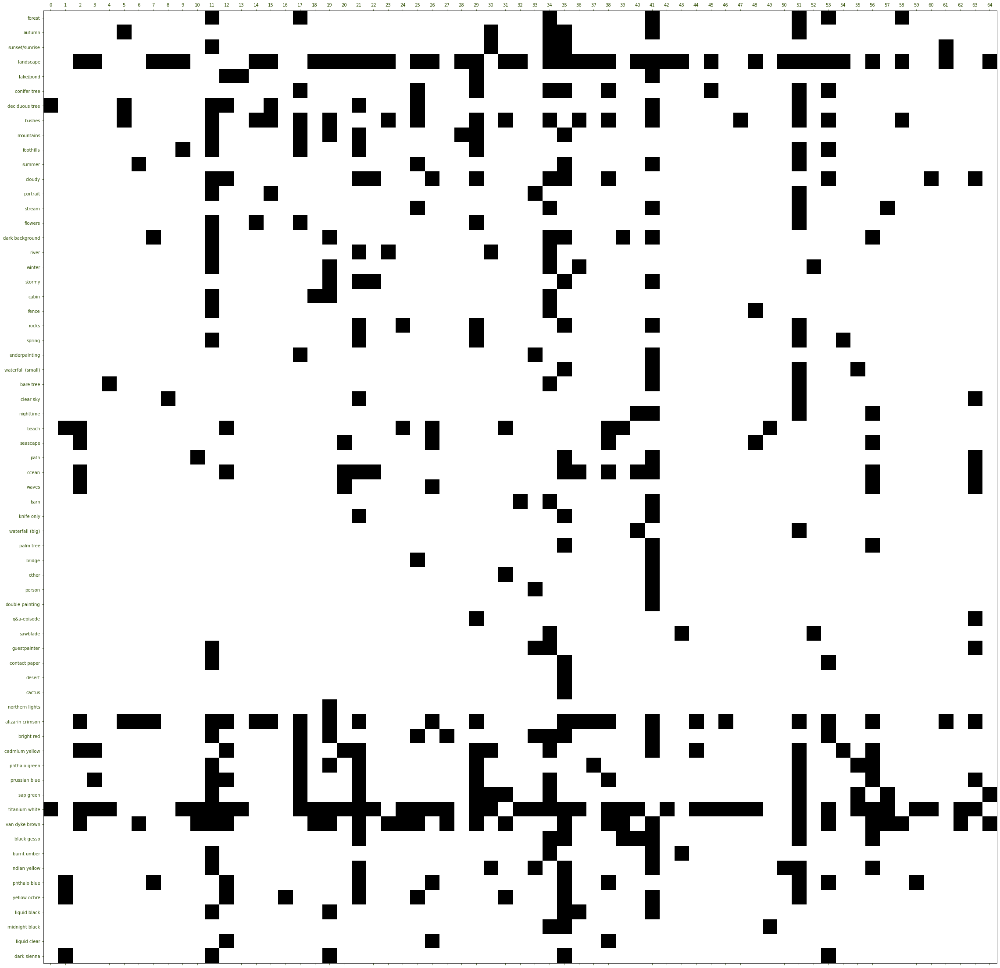

In [22]:
fig, ax = plt.subplots(figsize=(40, 40))
ax.spy(V)
ax.set_xticks(range(len(features)))
ax.set_yticks(range(len(features)))
ax.set_yticklabels(features);

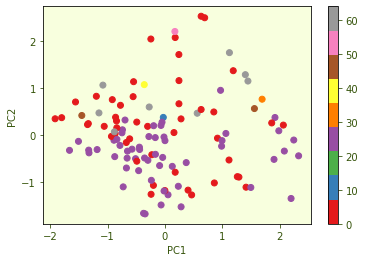

In [23]:
pca = PCA(2)
plt.scatter(*pca.fit_transform(painting_df).T, c=U.argmax(axis=1), cmap='Set1')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar();

In [24]:
np.unique(U.argmax(axis=1))

array([ 0,  2,  3, 11, 28, 34, 41, 45, 56, 60, 61, 63, 64])

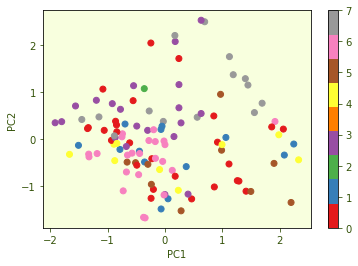

In [25]:
kmeans = KMeans()
plt.scatter(*pca.fit_transform(painting_df).T, c=kmeans.fit_predict(U), cmap='Set1')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar();